In [1]:
%load_ext autoreload
%autoreload 2

# Tracking

In [2]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.load('ssd_model.pt')
model.to(device)
print(f'SSD300 model loaded on {device}')

/Users/ruslanf/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


SSD300 model loaded on cpu


In [3]:
COCO_CLASSES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

print(f"COCO dataset: {len(COCO_CLASSES)} classes")

COCO dataset: 91 classes


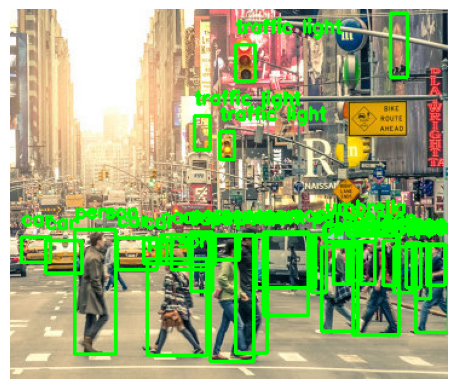

In [5]:
from tracking import extract_detections, draw_detections
import cv2

frame = cv2.imread('./tests/00_unittest_detection_input/new_york.jpg')[:, :, ::-1]
detections = extract_detections(model, [frame], .15, COCO_CLASSES)[0]
_ = draw_detections(frame, detections)

# Detections Matching & MOTP

In [6]:
from tracker import Tracker
from tracking import save_video, motp_mota
import os

video_path = './tests/02_unittest_tracker_input/frames'
frames = [cv2.imread(os.path.join(video_path, file))[:, :, ::-1] for file in os.listdir(video_path)]

processed_frames = []
tracker = Tracker()
for frame in frames:
    processed_frames.append(tracker.update_frame(frame))

save_video(processed_frames, 'processed_videos', 'tracker_input.mp4')


gt_tracks = [
    [[0, 1061, 400, 1269, 631], [1, 853, 416, 942, 470]],
    [[0, 1046, 402, 1280, 633], [1, 847, 416, 938, 468]],
    [[0, 1026, 398, 1279, 645], [1, 847, 416, 938, 468]],
    [[0, 1020, 404, 1280, 643], [1, 847, 415, 937, 467]],
    [[0, 1009, 402, 1280, 627], [1, 848, 410, 942, 464]]
]

motp, _ = motp_mota(tracker.detection_history, gt_tracks, .5)
print(f'MOTP: {motp}')

AttributeError: 'Tracker' object has no attribute 'update_frame'

# Normalized Cross-Correlation

Road

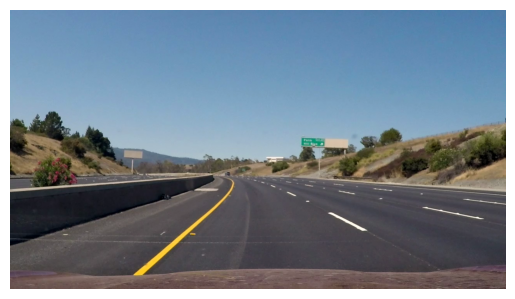

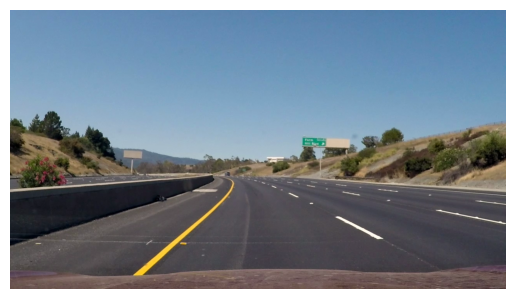

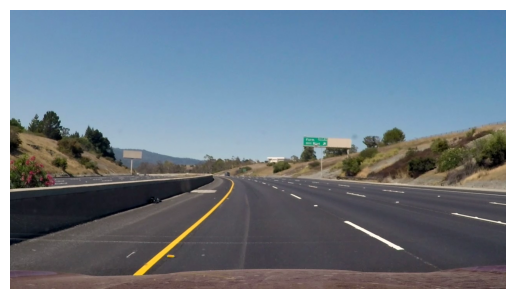

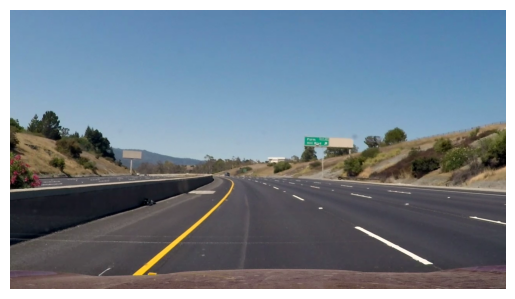

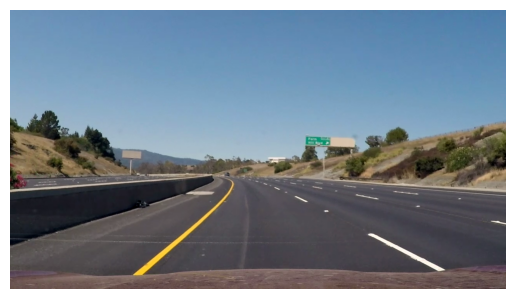

...

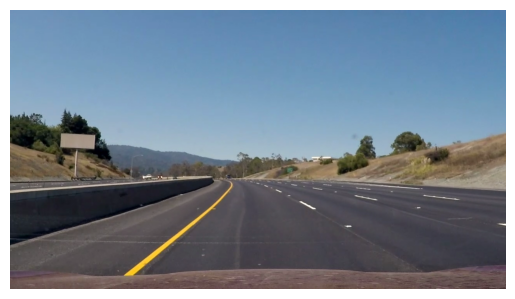

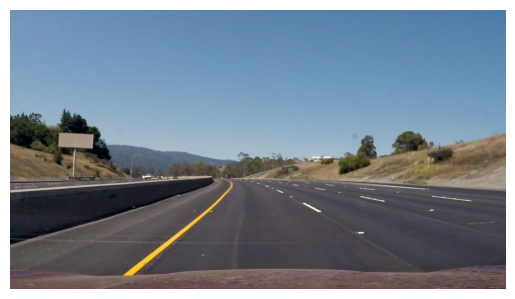

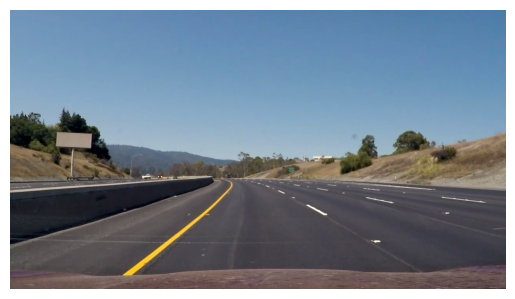

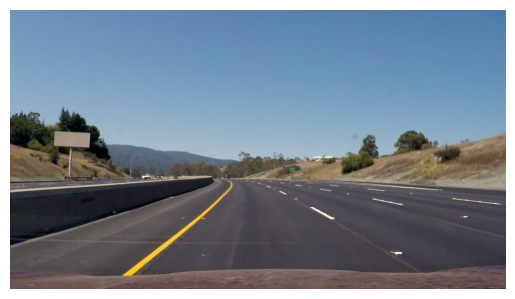

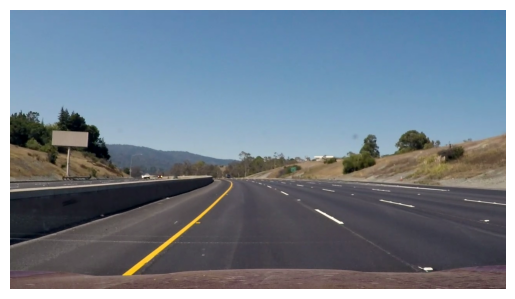

KeyboardInterrupt: 

In [ ]:
import cv2
from tracker import CorrelationTracker
import pandas as pd

folder = './tests/06_unittest_tracking_input/data/'
video_capture = cv2.VideoCapture(folder + 'road.mp4')

tracker = CorrelationTracker(lookup_tail_size=100, confidence=.6, min_iou=.3, detection_rate=15, return_images=True, display_result=False)
processed_frames = []

while True:
    ret, frame = video_capture.read()
    if not ret:
        break
    processed_frames.append(tracker.update_frame(frame[:, :, ::-1]))

video_capture.release()
save_video(processed_frames, 'processed_videos', 'road.mp4')

In [8]:
df = pd.read_csv(folder + 'road.csv')
df.columns = ['frame', 'detection_id', 'x1', 'y1', 'x2', 'y2']
df = (df.groupby('frame')[['detection_id', 'x1', 'y1', 'x2', 'y2']]
                         .apply(lambda x: x.values.tolist()))

motp, mota = motp_mota(tracker.detection_history, df, .5)
print(f'MOTP: {motp} MOTA: {mota}')

MOTP: 1.0 MOTA: 1.0


Jogging

In [262]:
import cv2
from tracker import CorrelationTracker
import pandas as pd

folder = './tests/06_unittest_tracking_input/data/'
video_capture = cv2.VideoCapture(folder + 'jogging.mp4')

tracker = CorrelationTracker(lookup_tail_size=80, confidence=.3, min_iou=.3, return_images=True, display_result=False)
processed_frames = []

while True:
    ret, frame = video_capture.read()
    if not ret:
        break
    processed_frames.append(tracker.update_frame(frame[:, :, ::-1]))

video_capture.release()
save_video(processed_frames, 'processed_videos', 'jogging.mp4')

Video saved to processed_videos/jogging.mp4


In [263]:
df = pd.read_csv(folder + 'jogging.csv')
df.columns = ['frame', 'detection_id', 'x1', 'y1', 'x2', 'y2']
df = (df.groupby('frame')[['detection_id', 'x1', 'y1', 'x2', 'y2']]
                         .apply(lambda x: x.values.tolist()))

motp, mota = motp_mota(tracker.detection_history, df, .5)
print(f'MOTP: {motp} MOTA: {mota}')

MOTP: 0.754471005843249 MOTA: 0.6753670473083198


Street

In [264]:
import cv2
from tracker import CorrelationTracker
import pandas as pd

folder = './tests/06_unittest_tracking_input/data/'
video_capture = cv2.VideoCapture(folder + 'street.mp4')

tracker = CorrelationTracker(lookup_tail_size=80, confidence=.3, min_iou=.3, return_images=True, display_result=False)
processed_frames = []

while True:
    ret, frame = video_capture.read()
    if not ret:
        break
    processed_frames.append(tracker.update_frame(frame[:, :, ::-1]))

video_capture.release()
save_video(processed_frames, 'processed_videos', 'street.mp4')

Video saved to processed_videos/street.mp4


In [265]:
df = pd.read_csv(folder + 'street.csv')
df.columns = ['frame', 'detection_id', 'x1', 'y1', 'x2', 'y2']
df = (df.groupby('frame')[['detection_id', 'x1', 'y1', 'x2', 'y2']]
                         .apply(lambda x: x.values.tolist()))

motp, mota = motp_mota(tracker.detection_history, df, .5)
print(f'MOTP: {motp} MOTA: {mota}')

MOTP: 0.7311366596654674 MOTA: 0.6197080291970802
